In [511]:
import numpy as np
import xarray as xr
import pandas as pd
import sys, os

# Gross fix this
sys.path.append(os.path.dirname(os.getcwd())); from utils import *

plt.rcParams['image.origin'] = 'lower'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[autoreload of typing_extensions failed: Traceback (most recent call last):
  File "/Users/mleclair/phd/code/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/mleclair/phd/code/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 500, in superreload
    update_generic(old_obj, new_obj)
  File "/Users/mleclair/phd/code/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 397, in update_generic
    update(a, b)
  File "/Users/mleclair/phd/code/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 365, in update_class
    update_instances(old, new)
  File "/Users/mleclair/phd/code/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 323, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: can't apply this __setattr__ to _ProtocolMeta object
]


In [515]:
import numpy as np
from scipy import ndimage as ndi
import time

def remove_loose_pixels_original(binary_image, min_size=1):
    s = np.array([[1,1,1],
                  [1,1,1],
                  [1,1,1]])
    
    labels, num_labels = ndi.label(binary_image, structure=s)
    component_sizes = np.bincount(labels.ravel())[1:]
    cleaned_image = np.zeros_like(binary_image)
    cleaned_image[labels > 0] = (component_sizes[labels[labels > 0] - 1] >= min_size)
    
    return cleaned_image

def remove_loose_pixels_optimized(binary_image, min_size=1):

def profile_and_compare(image_size=(1000, 1000), min_size=10, num_runs=10):
    np.random.seed(42)  # For reproducibility
    binary_image = np.random.randint(0, 2, size=image_size).astype(bool)

    def time_function(func):
        start_time = time.time()
        for _ in range(num_runs):
            result = func(binary_image, min_size)
        end_time = time.time()
        return (end_time - start_time) / num_runs, result

    original_time, original_result = time_function(remove_loose_pixels_original)
    optimized_time, optimized_result = time_function(remove_loose_pixels_optimized)

    print(f"Image size: {image_size}")
    print(f"Minimum component size: {min_size}")
    print(f"Number of runs: {num_runs}")
    print(f"Original function average time: {original_time:.6f} seconds")
    print(f"Optimized function average time: {optimized_time:.6f} seconds")
    print(f"Speedup: {original_time / optimized_time:.2f}x")

    if np.array_equal(original_result, optimized_result):
        print("Both functions produce identical results.")
    else:
        print("Warning: Functions produce different results.")
        diff = np.sum(original_result != optimized_result)
        total = np.prod(image_size)
        print(f"Number of differing pixels: {diff} out of {total} ({diff/total*100:.2f}%)")
        
    # Additional analysis
    print(f"\nOriginal output - unique values: {np.unique(original_result)}")
    print(f"Optimized output - unique values: {np.unique(optimized_result)}")
    print(f"Original output - sum: {np.sum(original_result)}")
    print(f"Optimized output - sum: {np.sum(optimized_result)}")

profile_and_compare()

Image size: (1000, 1000)
Minimum component size: 10
Number of runs: 10
Original function average time: 0.020642 seconds
Optimized function average time: 0.012547 seconds
Speedup: 1.65x
Both functions produce identical results.

Original output - unique values: [False  True]
Optimized output - unique values: [False  True]
Original output - sum: 493440
Optimized output - sum: 493440


In [133]:
# Here's a list of the video keys and associated missions
files_and_missions = [('20211013T130100Z', []),
                      ('20211012T133100Z', ['28']),
                      ('20211010T160100Z', []),
                      ('20211014T120100Z', []),
                      ('20211014T123100Z', ['33']),
                      ('20211010T150100Z', []),
                      ('20211013T170100Z', []),
                      ('20211011T140100Z', []),
                      ('20211011T143100Z', ['25']),
                      ('20211014T130100Z', ['34']),
                      ('20211013T160100Z', []),
                      ('20211013T163100Z', ['31']),
                      ('20211013T140100Z', []),
                      ('20211013T143100Z', ['30']),
                      ('20211011T130100Z', [])]


array_8m = xr.load_dataset('../../../data/FRF-ocean_waves_8m-array_202110.nc')


In [134]:
# Go through and find all the > SECONDS duration clips
data = []
SECONDS = 60
for time, missions in files_and_missions:
    file = os.path.join('../../../data/argus', f'ArgusFF_{time}_RectifiedVideo.avi')
    N, W, H, FPS = get_video_shape(file)
    timestack = load_frames(file)
    
    good_data = np.sum(timestack[:, 500].T == 0, axis=0) <= 50
    edges = np.convolve((np.convolve(good_data, np.ones(FPS * SECONDS)) == FPS * 60),np.array([1, -1]))

    start = np.maximum(0, np.where(edges == 1)[0] - FPS * SECONDS)
    end =   np.where(edges == -1)[0]

    data.append(
        {
            'video': {
                'filename': os.path.abspath(file),
                'key': time,
                'good_data': list(zip(start, end)) 
            },
            'missions': [{
                'filename': os.path.abspath(f'../../../data/swift/doi_10_5061_dryad_hx3ffbgk0__v20230321/mission{mission}.nc')
            } for mission in missions]
        }
    )
    del timestack
    print(data[-1])
    break

3.072gb allocated


Building Timestack:   0%|          | 0/3840 [00:00<?, ?it/s]

Building Timestack: 100%|██████████| 3840/3840 [00:07<00:00, 508.09it/s]


{'video': {'filename': '/Users/mleclair/Dropbox/phd/code/dunex/data/argus/ArgusFF_20211013T130100Z_RectifiedVideo.avi', 'key': '20211013T130100Z', 'good_data': [(0, 218), (2078, 2915)]}, 'missions': []}


In [331]:
for dat in data:
    vid = dat['video']
    file = vid['filename']
    slices = vid['good_data']
    N, W, H, FPS = get_video_shape(file)
    timestack = load_frames(file)

3.072gb allocated


Building Timestack:   0%|          | 0/3840 [00:00<?, ?it/s]

Building Timestack: 100%|██████████| 3840/3840 [00:06<00:00, 598.33it/s]


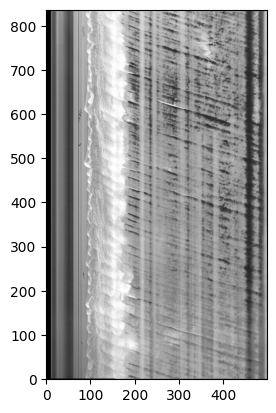

In [332]:
timestack = timestack[slices[1][0]:slices[1][1]]
plt.imshow(timestack[:, 500])

  0%|          | 0/300 [00:00<?, ?it/s]

100%|██████████| 300/300 [00:09<00:00, 32.20it/s]


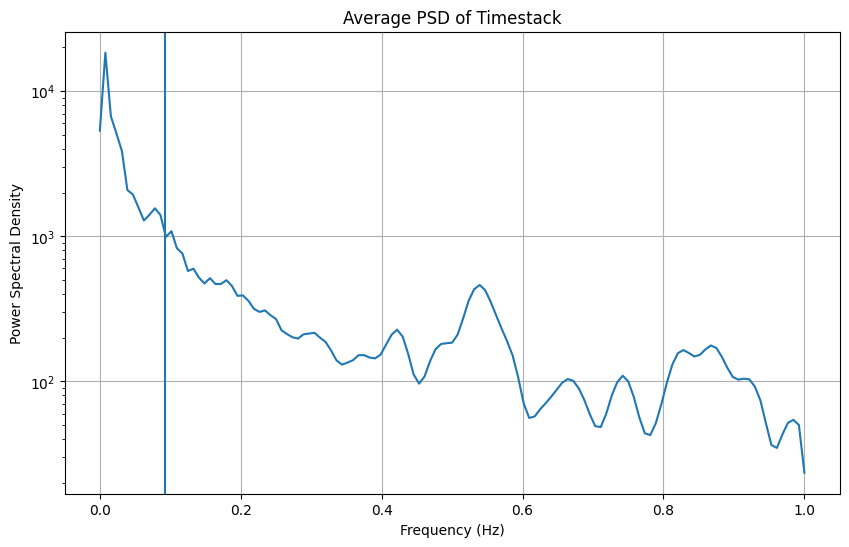

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def compute_psd_timestack(timestack, fs=1.0, nperseg=None):
    """
    Compute the Power Spectral Density (PSD) for a timestack of images using Welch's method.
    
    Parameters:
    timestack (numpy.ndarray): 3D array of shape (t, y, x) representing the timestack
    fs (float): Sampling frequency (default: 1.0)
    nperseg (int): Length of each segment for Welch's method (default: None, which uses 256 or t/8, whichever is smaller)
    
    Returns:
    frequencies (numpy.ndarray): Frequency array
    psd (numpy.ndarray): 1D array representing the average PSD
    """
    t, y, x = timestack.shape
    
    if nperseg is None:
        nperseg = min(256, t // 8)
    
    # Compute PSD for a single time series to get the frequency array
    f, _ = signal.welch(timestack[:, 0, 0], fs=fs, nperseg=nperseg)
    freq_bins = len(f)
    
    # Pre-allocate the PSD array
    psd = np.zeros((freq_bins, y, x))
    
    for i in tqdm(range(y)):
        for j in range(x):
            _, pxx = signal.welch(timestack[:, i, j], fs=fs, nperseg=nperseg)
            psd[:, i, j] = pxx
    
    # Average PSD across all pixels
    avg_psd = np.mean(psd, axis=(1, 2))
    
    return f, avg_psd

# Example usage
# Assuming you have a timestack loaded as a numpy array
fs = 2.0  # Adjust this to your actual sampling frequency
nperseg = 256  # Adjust this value as needed

freq, psd = compute_psd_timestack(timestack[:256, 500:800, :], fs=fs, nperseg=nperseg)


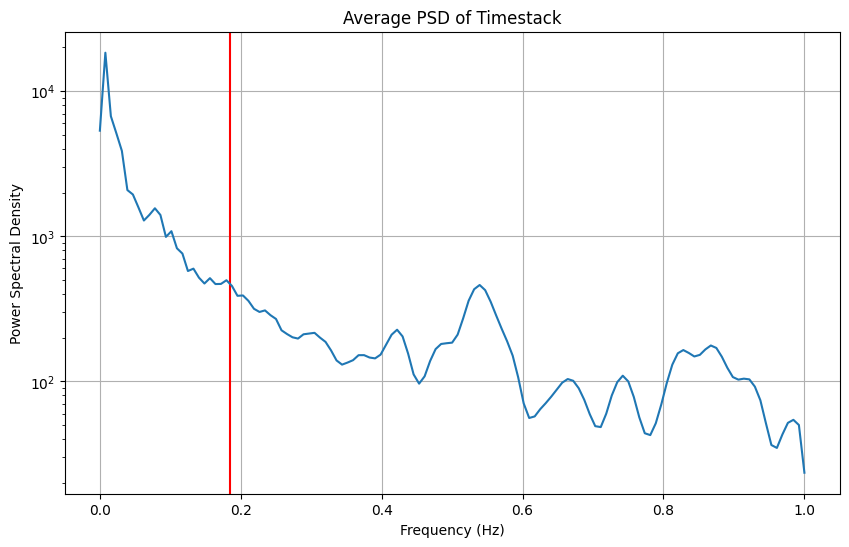

In [93]:
plt.figure(figsize=(10, 6))
Tp = array_8m.sel(time=pd.to_datetime(vid['key']).tz_localize(None), method='nearest').waveTp.item()
plt.axvline(2/Tp, label='Tp', c='r')
plt.semilogy(freq, psd)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.title('Average PSD of Timestack')
plt.grid(True)
plt.show()

In [361]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

def lowpass_filter_timestack(timestack, cutoff_freq, fs, order=5):
    """
    Apply a low-pass filter to video frames in a timestack.
    
    Parameters:
    timestack (numpy.ndarray): 3D array of shape (t, y, x) representing the timestack
    cutoff_freq (float): Cutoff frequency of the low-pass filter in Hz
    fs (float): Sampling frequency of the video in Hz
    order (int): Order of the Butterworth filter (default: 5)
    
    Returns:
    numpy.ndarray: Filtered timestack with the same shape as the input
    """
    t, y, x = timestack.shape
    
    # Design the Butterworth low-pass filter
    nyquist_freq = 0.5 * fs
    normalized_cutoff = cutoff_freq / nyquist_freq
    b, a = signal.butter(order, normalized_cutoff, btype='low', analog=False)
    
    # Apply the filter along the time axis for each pixel
    filtered_timestack = np.zeros_like(timestack)
    for i in tqdm(range(y)):
        for j in range(x):
            filtered_timestack[:, i, j] = signal.filtfilt(b, a, timestack[:, i, j].astype(float))
    
    return filtered_timestack

# Example usage
# Assuming you have a timestack loaded as a numpy array
# t, y, x = 500, 50, 50
to_filt = timestack
t, x, y = to_filt.shape
# timestack = np.random.rand(t, y, x)  # Example timestack

# Set filter parameters
cutoff_freq = 2/Tp  # Cutoff frequency in Hz
fs = 2  # Sampling frequency in Hz

# Apply the low-pass filter
filtered_timestack = lowpass_filter_timestack(to_filt, cutoff_freq, fs)

# Plot an example pixel's time series before and after filtering
pixel_y, pixel_x = 100, 100  # Choose a pixel to visualize
time = np.arange(t) / fs

plt.figure(figsize=(12, 6))
plt.plot(time, to_filt[:, pixel_y, pixel_x], label='Original', alpha=0.7)
plt.plot(time, filtered_timestack[:, pixel_y, pixel_x], label='Filtered', linewidth=2)
plt.xlabel('Time (s)')
plt.ylabel('Pixel Value')
plt.title(f'Low-Pass Filter Example (Pixel {pixel_y}, {pixel_x})')
plt.legend()
plt.grid(True)
plt.show()

  0%|          | 0/1600 [00:00<?, ?it/s]

 12%|█▏        | 197/1600 [00:04<00:35, 39.88it/s]


KeyboardInterrupt: 

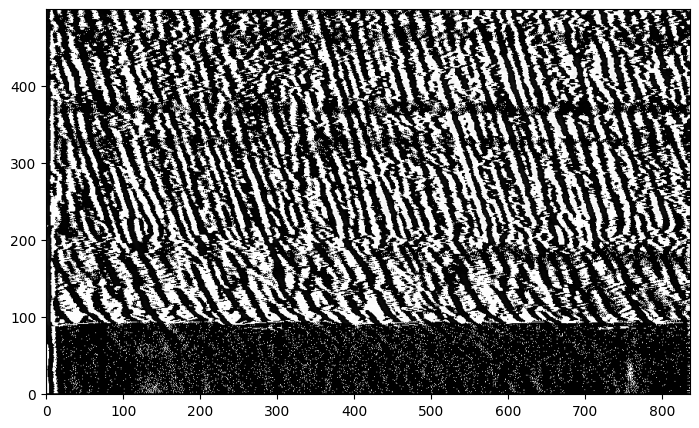

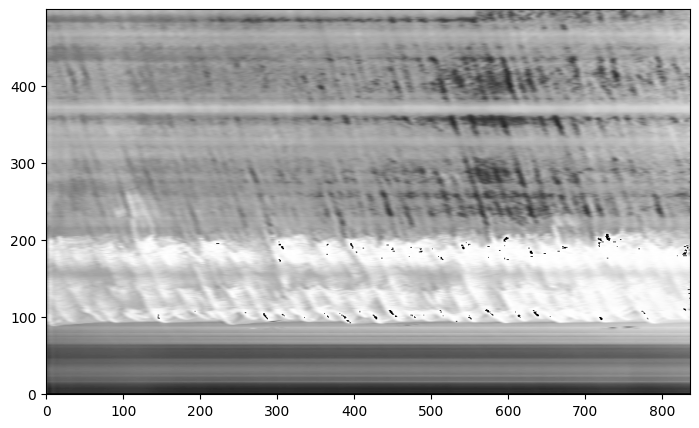

In [128]:
plt.figure(figsize=(20, 5))
i = 300
plt.imshow(filtered_timestack[1:, i, :].T - filtered_timestack[:-1, i, :].T)
plt.figure(figsize=(20, 5))
i = 300
plt.imshow(filtered_timestack[1:, i, :].T)

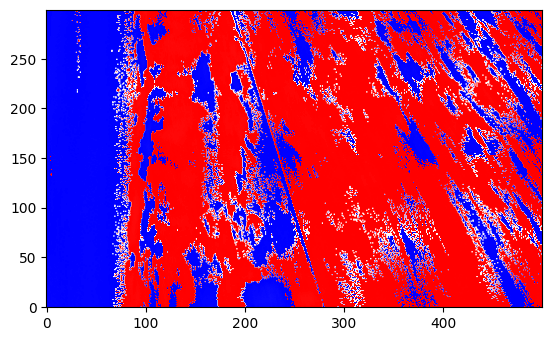

In [118]:
plt.imshow((filtered_timestack[1:] - filtered_timestack[:-1])[16], cmap='bwr')

In [129]:
1/Tp

0.09203125061711763

In [130]:
1/60

0.016666666666666666

100%|██████████| 500/500 [00:09<00:00, 53.53it/s]


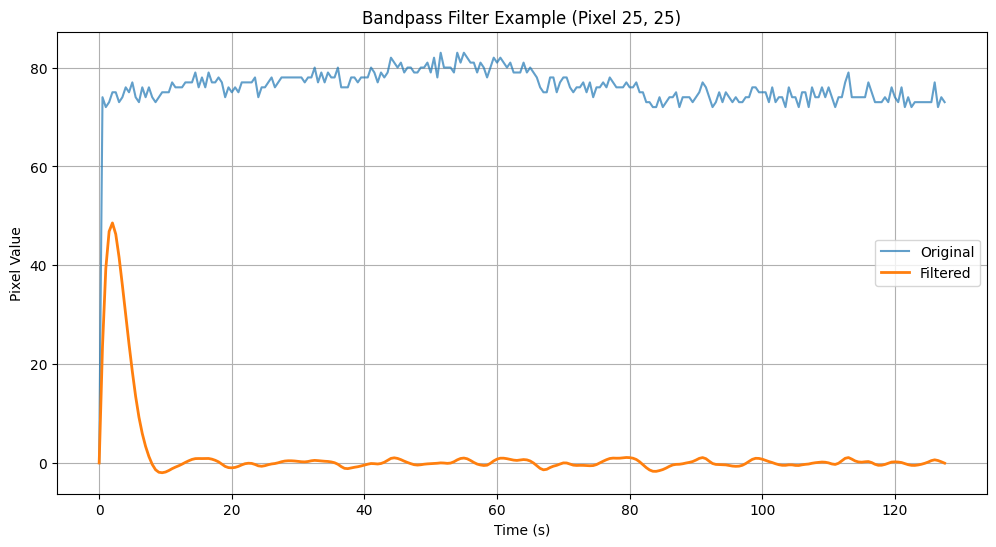

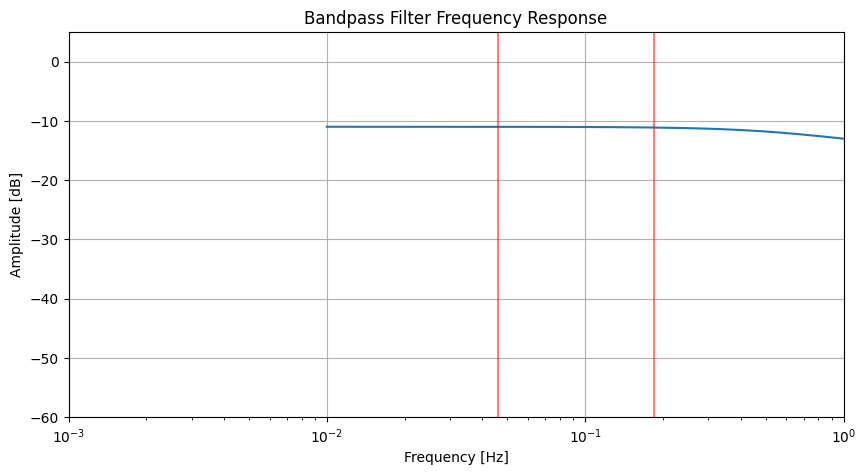

In [441]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

def bandpass_filter_timestack(timestack, lowcut, highcut, fs, order=5):
    """
    Apply a bandpass filter to video frames in a timestack.
    
    Parameters:
    timestack (numpy.ndarray): 3D array of shape (t, y, x) representing the timestack
    lowcut (float): Lower cutoff frequency of the bandpass filter in Hz
    highcut (float): Higher cutoff frequency of the bandpass filter in Hz
    fs (float): Sampling frequency of the video in Hz
    order (int): Order of the Butterworth filter (default: 5)
    
    Returns:
    numpy.ndarray: Filtered timestack with the same shape as the input
    """
    t, y, x = timestack.shape
    
    # Design the Butterworth bandpass filter
    nyquist_freq = 0.5 * fs
    low = lowcut / nyquist_freq
    high = highcut / nyquist_freq
    b, a = signal.butter(order, [low, high], btype='band', analog=False)
    
    # Apply the filter along the time axis for each pixel
    filtered_timestack = np.zeros_like(timestack)
    for i in tqdm(range(y)):
        for j in range(x):
            filtered_timestack[:, i, j] = signal.filtfilt(b, a, timestack[:, i, j])
    
    return filtered_timestack

# Example usage
# Assuming you have a timestack loaded as a numpy array
t, y, x = timestack[:256, :500].shape

# Add some synthetic signals for demonstration

# Set filter parameters
lowcut = 0.5/Tp  # Lower cutoff frequency in Hz
highcut = 2/Tp  # Higher cutoff frequency in Hz
fs = 2.0  # Sampling frequency in Hz
order = 1

# Apply the bandpass filter
filtered_timestack = bandpass_filter_timestack(timestack[:256, :500].astype(float), lowcut, highcut, fs, order)

# Plot an example pixel's time series before and after filtering
pixel_y, pixel_x = 25, 25  # Choose a pixel to visualize
time = np.arange(t) / fs

plt.figure(figsize=(12, 6))
plt.plot(time, timestack[:256, :500][:, pixel_y, pixel_x], label='Original', alpha=0.7)
plt.plot(time, filtered_timestack[:, pixel_y, pixel_x], label='Filtered', linewidth=2)
plt.xlabel('Time (s)')
plt.ylabel('Pixel Value')
plt.title(f'Bandpass Filter Example (Pixel {pixel_y}, {pixel_x})')
plt.legend()
plt.grid(True)
plt.show()

# Plot the frequency response of the filter
w, h = signal.freqs(*signal.butter(order, [lowcut, highcut], btype='band', analog=False, fs=fs))
plt.figure(figsize=(10, 5))
plt.semilogx(w, 20 * np.log10(np.abs(h)))
plt.title('Bandpass Filter Frequency Response')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [dB]')
plt.grid(True)
plt.axvline(lowcut, color='red', alpha=0.5)
plt.axvline(highcut, color='red', alpha=0.5)
plt.ylim(-60, 5)
plt.xlim(0.001, fs/2)
plt.show()

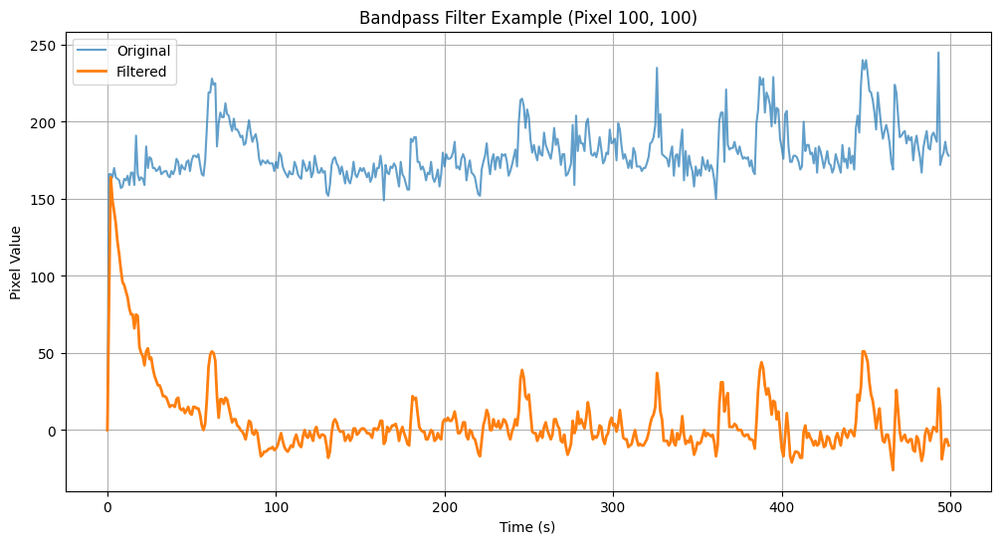

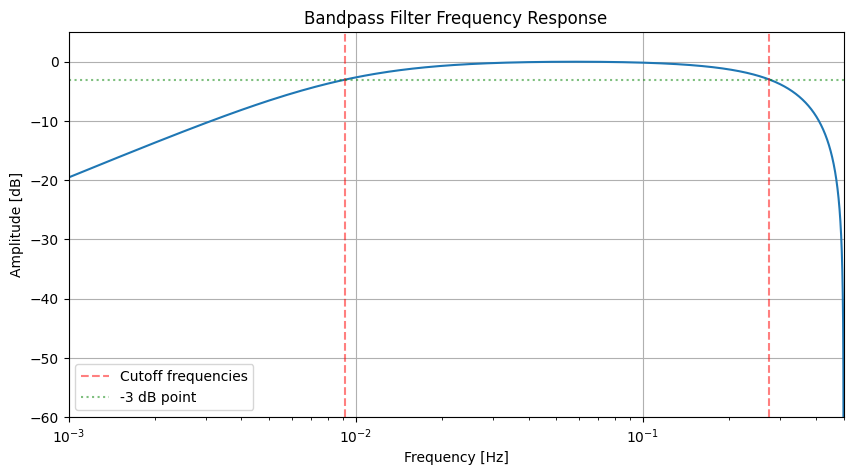

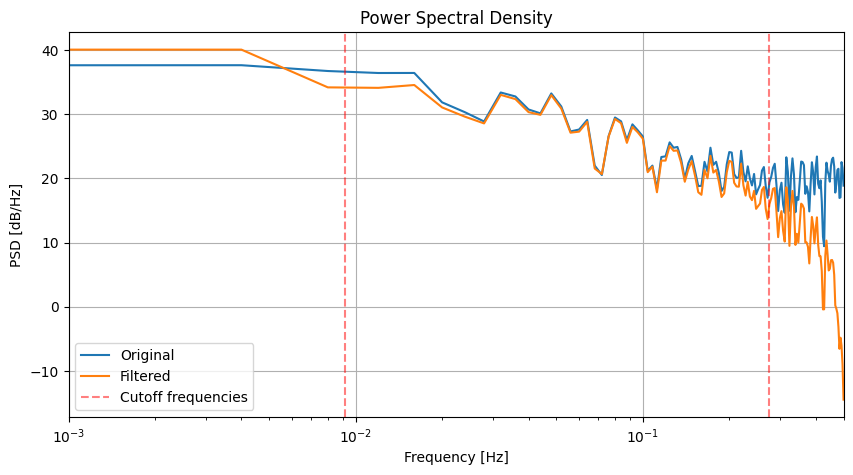

In [383]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

def bandpass_filter_timestack(timestack, lowcut, highcut, fs, order=5):
    """
    Apply a bandpass filter to video frames in a timestack.
    
    Parameters:
    timestack (numpy.ndarray): 3D array of shape (t, y, x) representing the timestack
    lowcut (float): Lower cutoff frequency of the bandpass filter in Hz
    highcut (float): Higher cutoff frequency of the bandpass filter in Hz
    fs (float): Sampling frequency of the video in Hz
    order (int): Order of the Butterworth filter (default: 5)
    
    Returns:
    numpy.ndarray: Filtered timestack with the same shape as the input
    """
    t, y, x = timestack.shape
    
    # Design the Butterworth bandpass filter
    nyquist_freq = 0.5 * fs
    low = lowcut / nyquist_freq
    high = highcut / nyquist_freq
    sos = signal.butter(order, [low, high], btype='band', output='sos')
    
    # Apply the filter along the time axis for each pixel
    filtered_timestack = np.zeros_like(timestack)
    for i in range(y):
        for j in range(x):
            filtered_timestack[:, i, j] = signal.sosfilt(sos, timestack[:, i, j])
    
    return filtered_timestack

# Example usage
# Assuming you have a timestack loaded as a numpy array
t, y, x = timestack[:500, :500].shape

# Set filter parameters
lowcut = 0.1/Tp  # Lower cutoff frequency in Hz
highcut = 3/Tp  # Higher cutoff frequency in Hz
fs = 1.0  # Sampling frequency in Hz
order = 1  # Filter order

# Apply the bandpass filter
bpf = bandpass_filter_timestack(timestack[200:300, :500].astype(np.int32), lowcut, highcut, fs, order)

# Plot an example pixel's time series before and after filtering
pixel_y, pixel_x = 100, 100  # Choose a pixel to visualize
time = np.arange(t) / fs

plt.figure(figsize=(12, 6))
plt.plot(time, timestack[:500, :500][:, pixel_y, pixel_x], label='Original', alpha=0.7)
plt.plot(time, filtered_timestack[:, pixel_y, pixel_x], label='Filtered', linewidth=2)
plt.xlabel('Time (s)')
plt.ylabel('Pixel Value')
plt.title(f'Bandpass Filter Example (Pixel {pixel_y}, {pixel_x})')
plt.legend()
plt.grid(True)
plt.show()

# Plot the frequency response of the filter
sos = signal.butter(order, [lowcut, highcut], btype='band', output='sos', fs=fs)
w, h = signal.sosfreqz(sos, worN=2000, fs=fs)
plt.figure(figsize=(10, 5))
plt.semilogx(w, 20 * np.log10(np.maximum(np.abs(h), 1e-5)))
plt.title('Bandpass Filter Frequency Response')
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude [dB]')
plt.grid(True)
plt.axvline(lowcut, color='red', alpha=0.5, linestyle='--', label='Cutoff frequencies')
plt.axvline(highcut, color='red', alpha=0.5, linestyle='--')
plt.axhline(-3, color='green', alpha=0.5, linestyle=':', label='-3 dB point')
plt.ylim(-60, 5)
plt.xlim(0.001, fs/2)
plt.legend()
plt.show()

# Plot the Power Spectral Density before and after filtering
def plot_psd(s, fs, label):
    f, Pxx = signal.welch(s, fs, nperseg=len(s)//2)
    plt.semilogx(f, 10 * np.log10(Pxx), label=label)

plt.figure(figsize=(10, 5))
plot_psd(timestack[:500, :500][:, pixel_y, pixel_x], fs, 'Original')
plot_psd(filtered_timestack[:, pixel_y, pixel_x], fs, 'Filtered')
plt.title('Power Spectral Density')
plt.xlabel('Frequency [Hz]')
plt.ylabel('PSD [dB/Hz]')
plt.grid(True)
plt.axvline(lowcut, color='red', alpha=0.5, linestyle='--', label='Cutoff frequencies')
plt.axvline(highcut, color='red', alpha=0.5, linestyle='--')
plt.legend()
plt.xlim(0.001, fs/2)
plt.show()

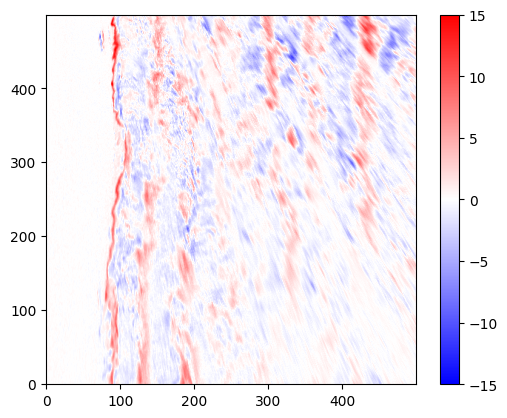

In [442]:
i = 52
plt.imshow(filtered_timestack[i] - filtered_timestack[i-1], cmap='bwr', vmin=-15, vmax=15)
plt.colorbar()

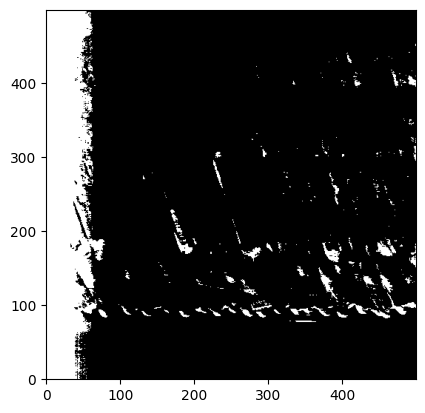

In [215]:
plt.imshow(filtered_timestack[:, 40, :].T > np.percentile(filtered_timestack[20:, 40, :].T, 95, axis=1))

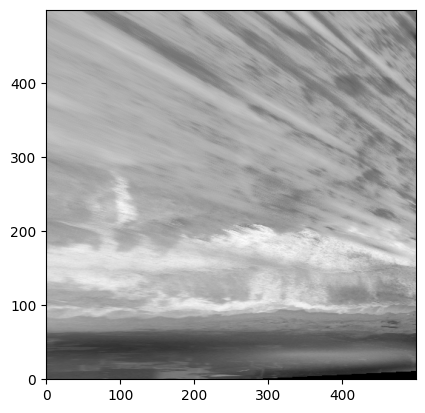

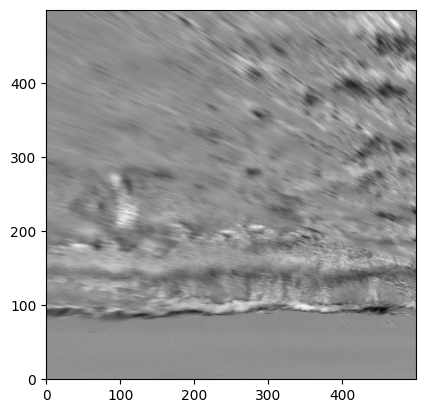

In [445]:
plt.imshow(timestack[20, :500].T)
plt.figure()
plt.imshow(filtered_timestack[22].T)

In [216]:
write_sequence_to_mp4(normalize(filtered_timestack[20:] > np.percentile(filtered_timestack[20:, :, :], 95, axis=1)[:, np.newaxis]), 'bandpass.mp4', H=500, W=500, FPS=2, transpose=True)

  9%|▊         | 41/480 [00:00<00:01, 403.63it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 24%|██▍       | 115/480 [00:00<00:01, 308.66it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 38%|███▊      | 181/480 [00:00<00:00, 300.16it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 44%|████▍     | 212/480 [00:00<00:00, 290.04it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 56%|█████▋    | 270/480 [00:00<00:00, 275.67it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 72%|███████▏  | 345/480 [00:01<00:00, 320.98it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


 88%|████████▊ | 421/480 [00:01<00:00, 347.23it/s]

uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)


100%|██████████| 480/480 [00:01<00:00, 320.48it/s]


uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500
uint8
(500, 500, 3)
500 500


(array([5.60000000e+01, 5.57200000e+03, 3.40888000e+05, 1.28095490e+07,
        1.03426552e+08, 4.82896400e+06, 1.78401900e+06, 1.20318000e+06,
        5.58014000e+05, 4.32060000e+04]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <BarContainer object of 10 artists>)

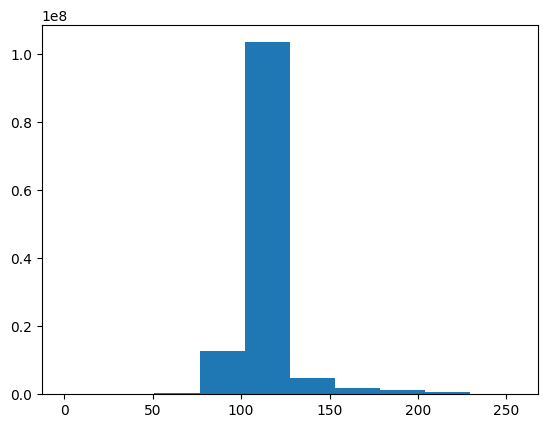

In [204]:
plt.hist(normalize(filtered_timestack).flatten())

In [251]:
def normalize(x, scale=255):
    x = x.astype(float)
    x = (x - x.min())
    return (x/x.max() * scale).astype(np.uint8)


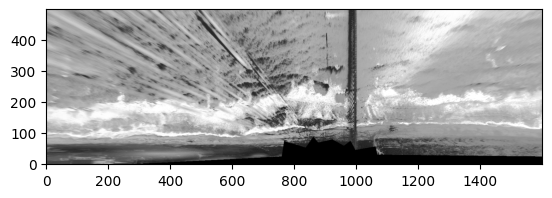

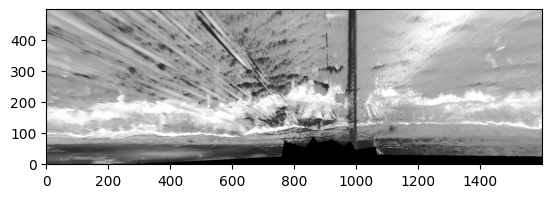

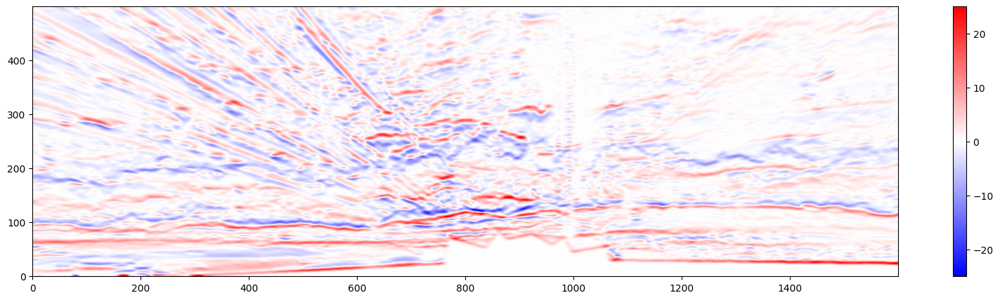

In [351]:
img = timestack[501]
p2, p98 = np.percentile(img, (2, 98))
from skimage import exposure
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))
plt.imshow(img.T)
plt.figure()
plt.imshow(img_rescale.T)
plt.figure(figsize=(20, 5))
img_adapteq = normalize(exposure.equalize_adapthist(img, kernel_size=(50, 500), clip_limit=0.03))
plt.imshow(ndi.gaussian_filter(np.gradient(img_rescale.T)[0], sigma=(2, 4)), cmap='bwr', vmin=-25, vmax=25)
plt.colorbar()

In [362]:
import numpy as np
from skimage import exposure
from tqdm import tqdm
from joblib import Parallel, delayed

lpf = lowpass_filter_timestack(to_filt[200:300], cutoff_freq, fs)

def process_timestack(i, timestack):
    return normalize(exposure.equalize_adapthist(timestack[i], kernel_size=(50, 500), clip_limit=0.03))

# Assuming timestack is already defined
timestack_eq = np.zeros_like(lpf)

# Parallelize the processing
results = Parallel(n_jobs=-1)(delayed(process_timestack)(i, lpf) for i in tqdm(range(len(timestack_eq))))

# Assign results back to timestack_eq
for i, result in enumerate(results):
    timestack_eq[i] = result

  0%|          | 0/1600 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:01<00:00, 56.92it/s]


In [363]:
dx = np.gradient(timestack_eq, axis=2)

def apply_bwr_colormap(gradient, vmin=-25, vmax=25):
        # Create a normalize function to map values to [0, 1]
        norm = plt.Normalize(vmin, vmax)
        
        # Create the bwr colormap
        cmap = plt.get_cmap('bwr')
        
        # Apply the colormap to the normalized data
        rgba_colors = cmap(norm(gradient))
        
        # Convert RGBA to BGR
        bgr_colors = rgba_colors[:, :, [2, 1, 0]]  # Extract BGR channels
        
        # Scale to 0-255 range and convert to uint8
        bgr_colors = (bgr_colors * 255).astype(np.uint8)
        
        return bgr_colors

def apply_hot_colormap(gradient, vmin=25, vmax=50):
        # Create a normalize function to map values to [0, 1]
        norm = plt.Normalize(vmin, vmax)
        
        # Create the bwr colormap
        cmap = plt.get_cmap('hot')
        
        # Apply the colormap to the normalized data
        rgba_colors = cmap(norm(gradient))
        
        # Convert RGBA to BGR
        bgr_colors = rgba_colors[:, :, [2, 1, 0]]  # Extract BGR channels
        
        # Scale to 0-255 range and convert to uint8
        bgr_colors = (bgr_colors * 255).astype(np.uint8)
        
        return bgr_colors



def disparity_map(frame, i, gradient):
    frame = apply_bwr_colormap(gradient[i])  
    return frame

def highlight_positive_gradient(frame, i, gradient):
    frame = apply_bwr_colormap(ndi.gaussian_filter(gradient[i], sigma=(2, 4)))
    return frame

write_sequence_to_mp4(np.zeros_like(dx), 'timestack_grad.mp4', fn=disparity_map, data=dx, FPS=2, color=True)

100%|██████████| 100/100 [00:02<00:00, 36.60it/s]


In [423]:
diff = timestack[2:] - 0.5 * (timestack[0:-2] + timestack[1:-1])

def apply_colormap(data, name, vmin, vmax):
    # Create a normalize function to map values to [0, 1]
    norm = plt.Normalize(vmin, vmax)
    
    # Create the bwr colormap
    cmap = plt.get_cmap(name)
    
    # Apply the colormap to the normalized data
    rgba_colors = cmap(norm(data))
    
    # Convert RGBA to BGR
    bgr_colors = rgba_colors[:, :, :, [2, 1, 0]]  # Extract BGR channels
    
    # Scale to 0-255 range and convert to uint8
    bgr_colors = (bgr_colors * 255).astype(np.uint8)
    
    return bgr_colors

colored = apply_colormap(ndi.sobel(diff), 'jet', 0, 500)


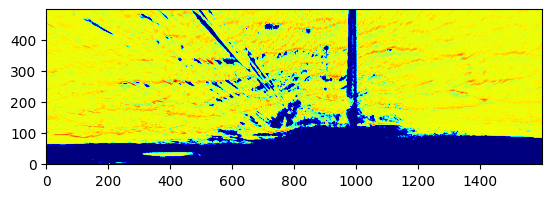

In [420]:
plt.imshow(di.sobel(diff[100].T), cmap='jet', vmin=0, vmax=500)

In [424]:
write_sequence_to_mp4(colored, 'timestack_diff.mp4', FPS=2, color=True)

  0%|          | 0/835 [00:00<?, ?it/s]

100%|██████████| 835/835 [00:17<00:00, 48.17it/s]


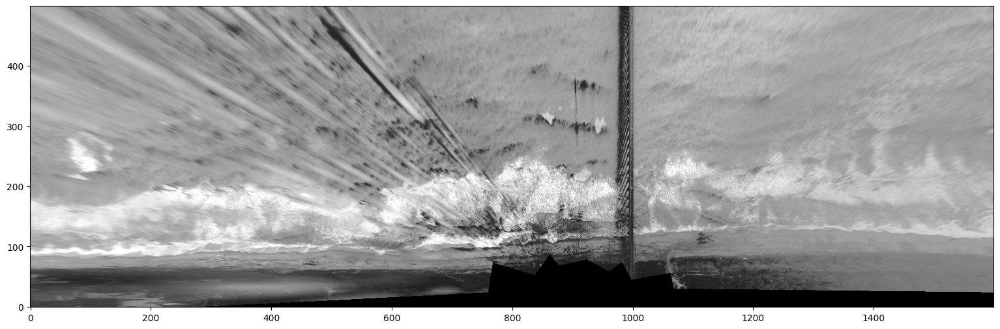

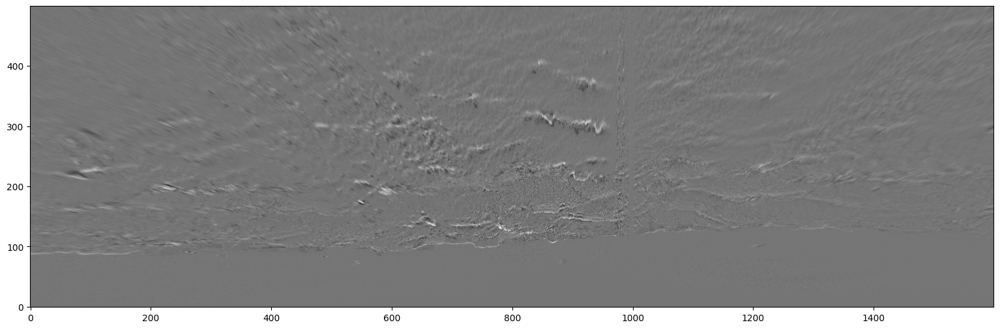

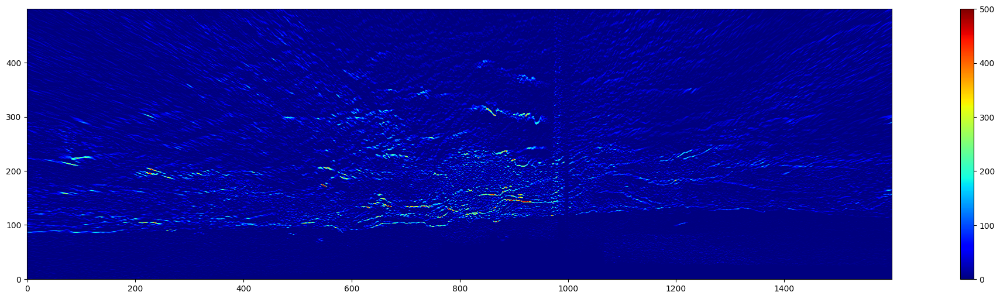

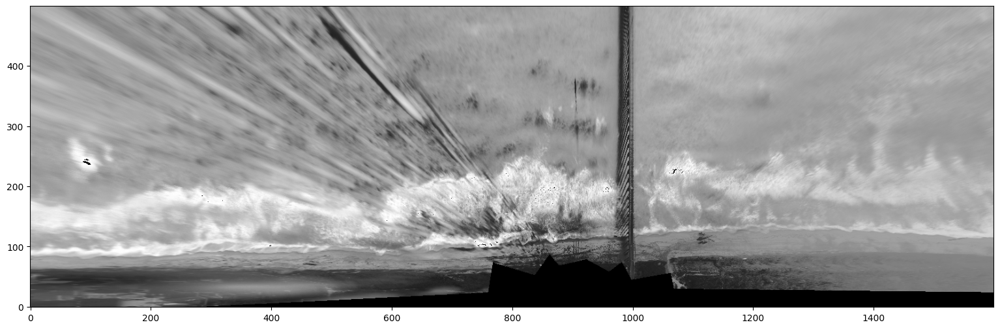

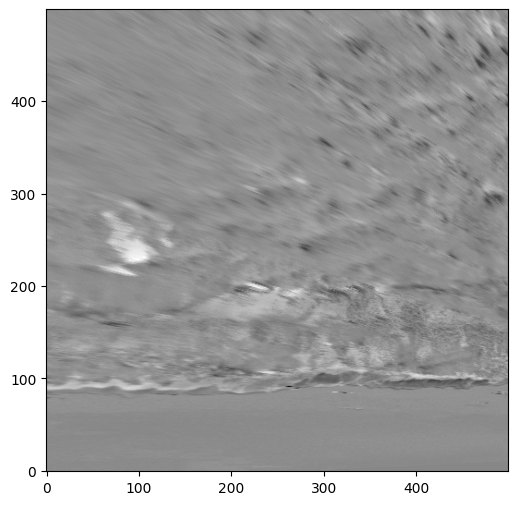

In [395]:
plt.figure(figsize=(30, 6))
plt.imshow((timestack[250]).T)
plt.figure(figsize=(30, 6))
plt.imshow((timestack[250] - 0.5*timestack[249] - 0.5*timestack[248]).T)
plt.figure(figsize=(30, 6))
plt.imshow(ndi.sobel((timestack[250] - 0.5*timestack[249] - 0.5*timestack[248]), axis=1).T, cmap='jet', vmin=0, vmax=500)
plt.colorbar()
plt.figure(figsize=(30, 6))
plt.imshow(lpf[50].T)
plt.figure(figsize=(30, 6))
plt.imshow(bpf[50].T)


In [452]:
timestack = timestack.astype
diff = timestack[2:] - 0.5 * (timestack[1:-1] + timestack[:-2])

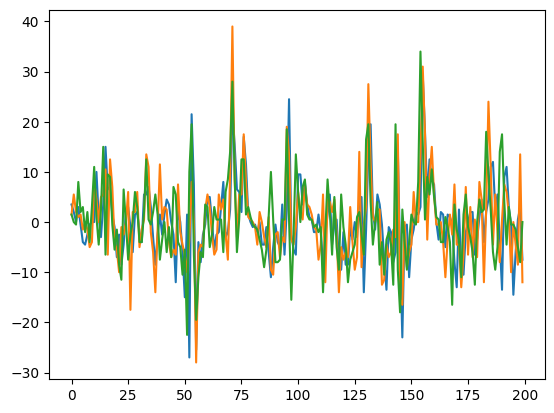

In [458]:
plt.plot(diff[200:400,  100, 150])
plt.plot(diff[200:400,  100, 151])
plt.plot(diff[200:400,  100, 152])

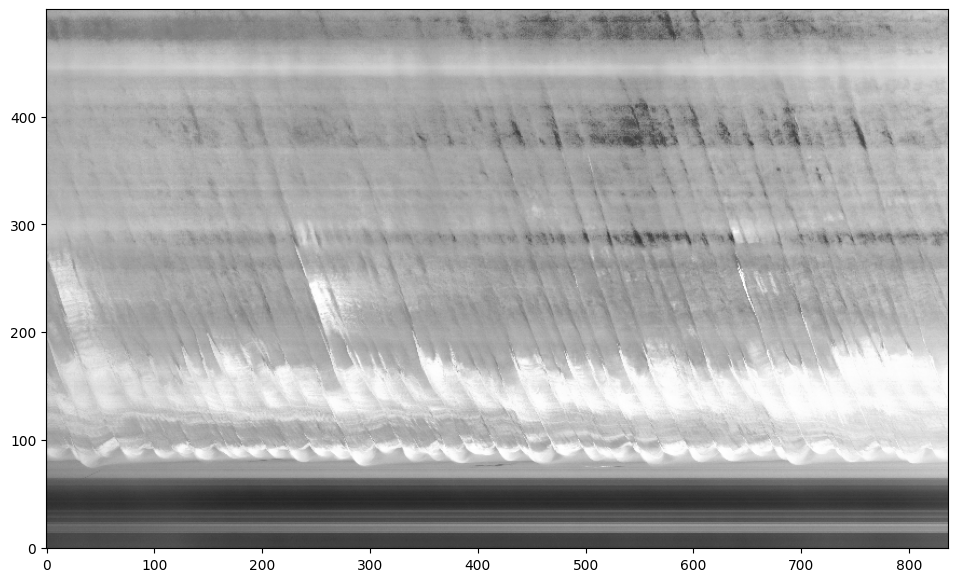

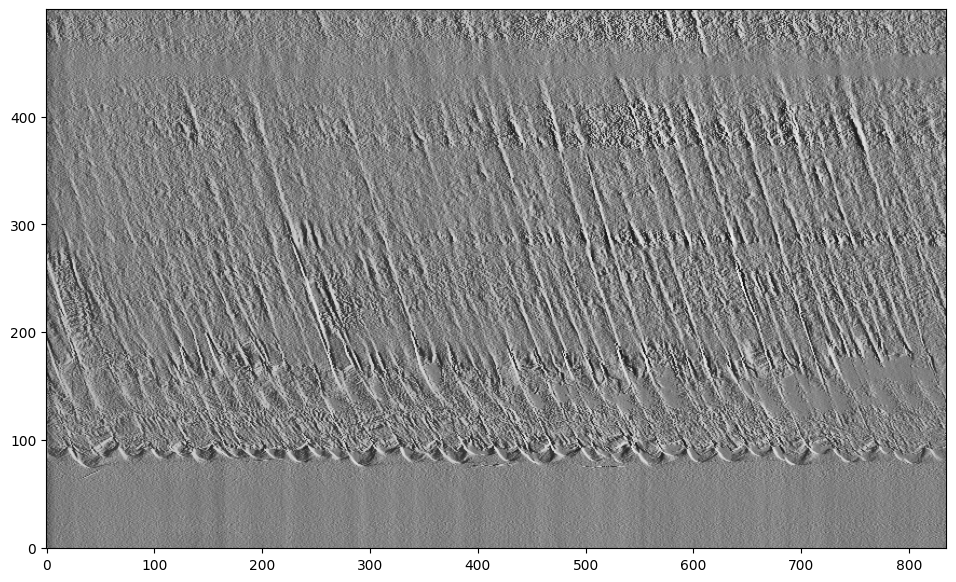

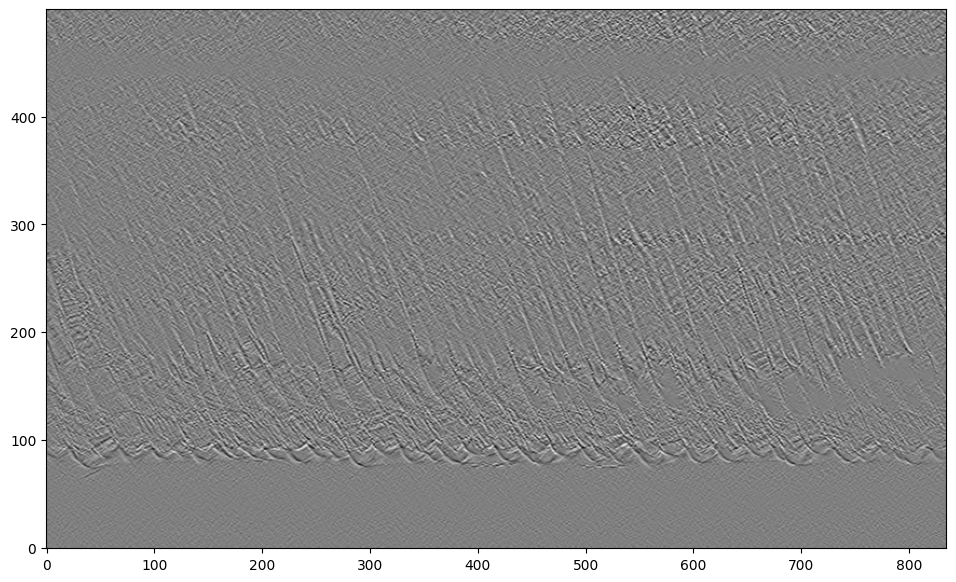

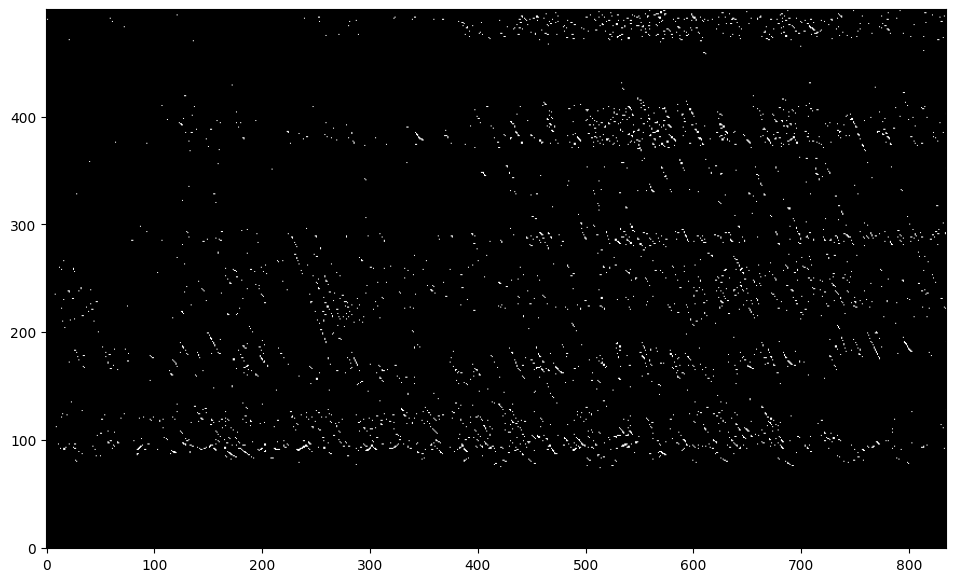

In [510]:
plt.figure(figsize=(40, 7))
plt.imshow(timestack[:, 100].T)

plt.figure(figsize=(40, 7))
eq = exposure.equalize_adapthist(normalize(diff[:, 100]), kernel_size=(5, len(timestack)), clip_limit=0.03)
plt.imshow(
    eq.T)

plt.figure(figsize=(40, 7))
sb = ndi.sobel(eq)
plt.imshow(
    sb.T)

plt.figure(figsize=(40, 7))
plt.imshow(
    (sb>np.percentile(sb, 99)).T)

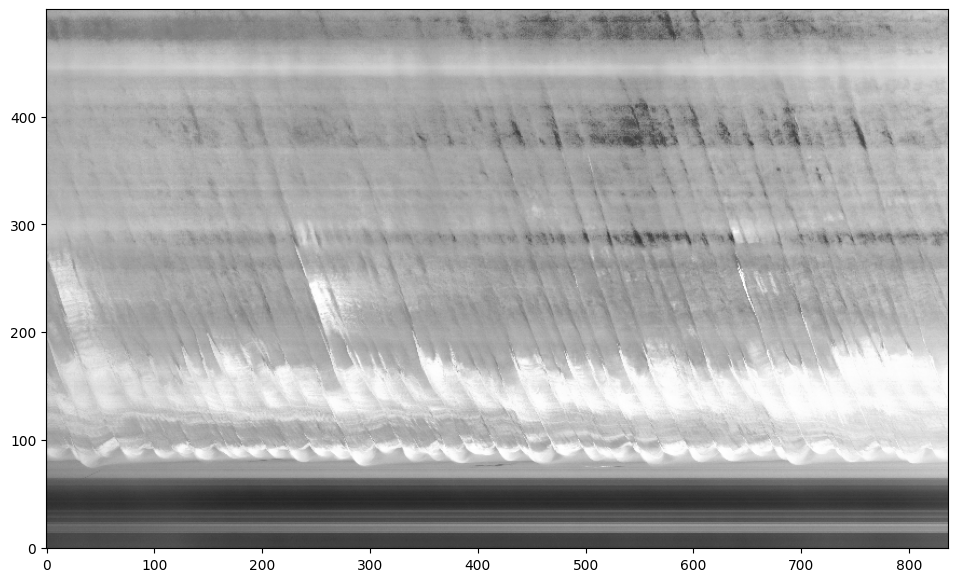

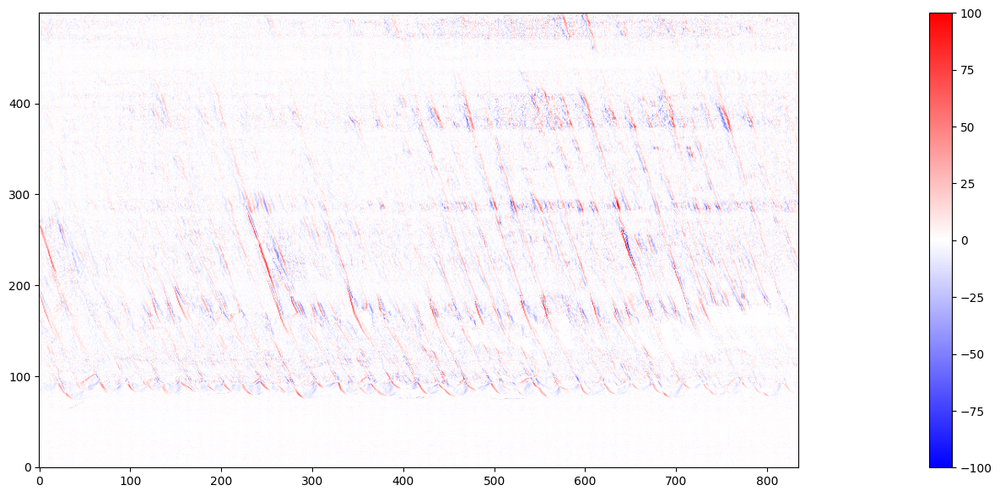

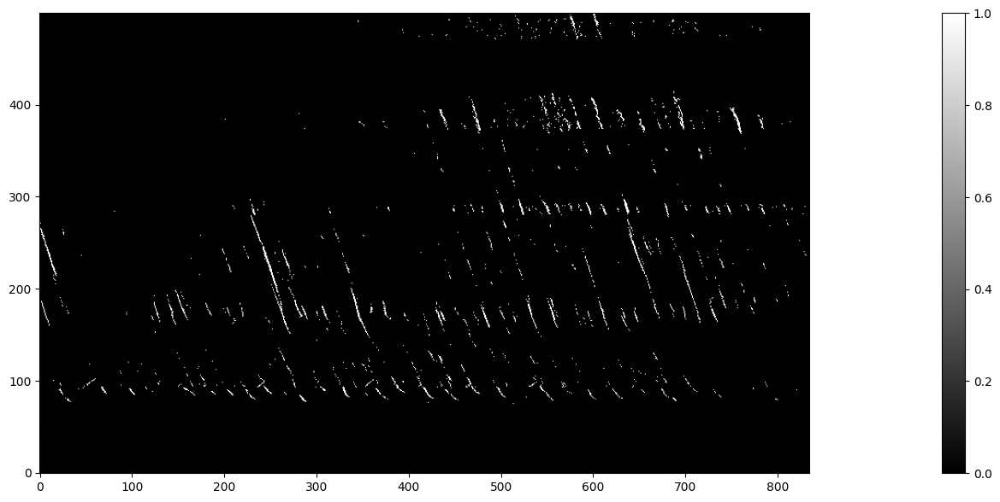

In [508]:
import torch
def normalize(video, scale=255):
    video_tensor = torch.from_numpy(video).float()
    vmin, vmax = video_tensor.min(), video_tensor.max()
    normalized = scale * (video_tensor - vmin) / (vmax - vmin)
    return normalized.byte().numpy()

plt.figure(figsize=(40, 7))
plt.imshow((timestack[:, 100].T))
plt.figure(figsize=(40, 7))
plt.imshow((diff[:, 100].T), cmap='bwr', vmin=-100, vmax=100)
plt.colorbar()
plt.figure(figsize=(40, 7))
plt.imshow((diff[:, 100].T) > np.percentile(diff[:, 100], 99))
plt.colorbar()


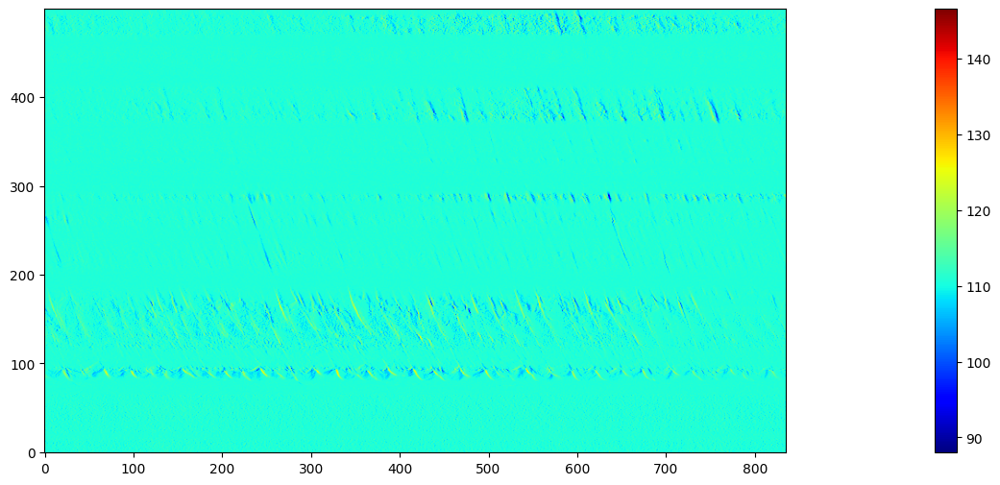

In [490]:
plt.figure(figsize=(40, 6))
plt.imshow((normalize(diff[:, 100] * timestack[:, 100].mean(0)) - diff[:, 100]).T, cmap='jet')
plt.colorbar()